In [1]:
# from dask import dataframe as dd
import pandas as pd
# import numpy as np
import datashader as ds
import datashader.transfer_functions as tf
from datashader.colors import inferno

In [2]:
from glob import glob

# Read Data

In [3]:
paths = './data/pubg/deaths/*.csv'

In [4]:
glob(paths)

['./data/pubg/deaths/kill_match_stats_final_3.csv',
 './data/pubg/deaths/kill_match_stats_final_2.csv',
 './data/pubg/deaths/kill_match_stats_final_0.csv',
 './data/pubg/deaths/kill_match_stats_final_1.csv',
 './data/pubg/deaths/kill_match_stats_final_4.csv']

In [5]:
data = pd.concat([pd.read_csv(p) for p in glob(paths)])

In [6]:
data.columns

Index(['killed_by', 'killer_name', 'killer_placement', 'killer_position_x',
       'killer_position_y', 'map', 'match_id', 'time', 'victim_name',
       'victim_placement', 'victim_position_x', 'victim_position_y'],
      dtype='object')

In [25]:
data.shape

(65370475, 12)

In [24]:
data['match_id'].nunique()

722425

In [7]:
for col in 'killer_position_x', 'victim_position_x':
    data[col] = data[col].clip(lower=0)

In [8]:
for col in 'killer_position_y', 'victim_position_y':
    data[col] = -1 * data[col]


In [9]:
erengel = data[data['map'] == 'ERANGEL']

# Density

In [10]:
cvs = ds.Canvas(plot_width=1000, plot_height=1000)

In [11]:
agg = cvs.points(erengel, 'victim_position_x', 'victim_position_y', ds.count())

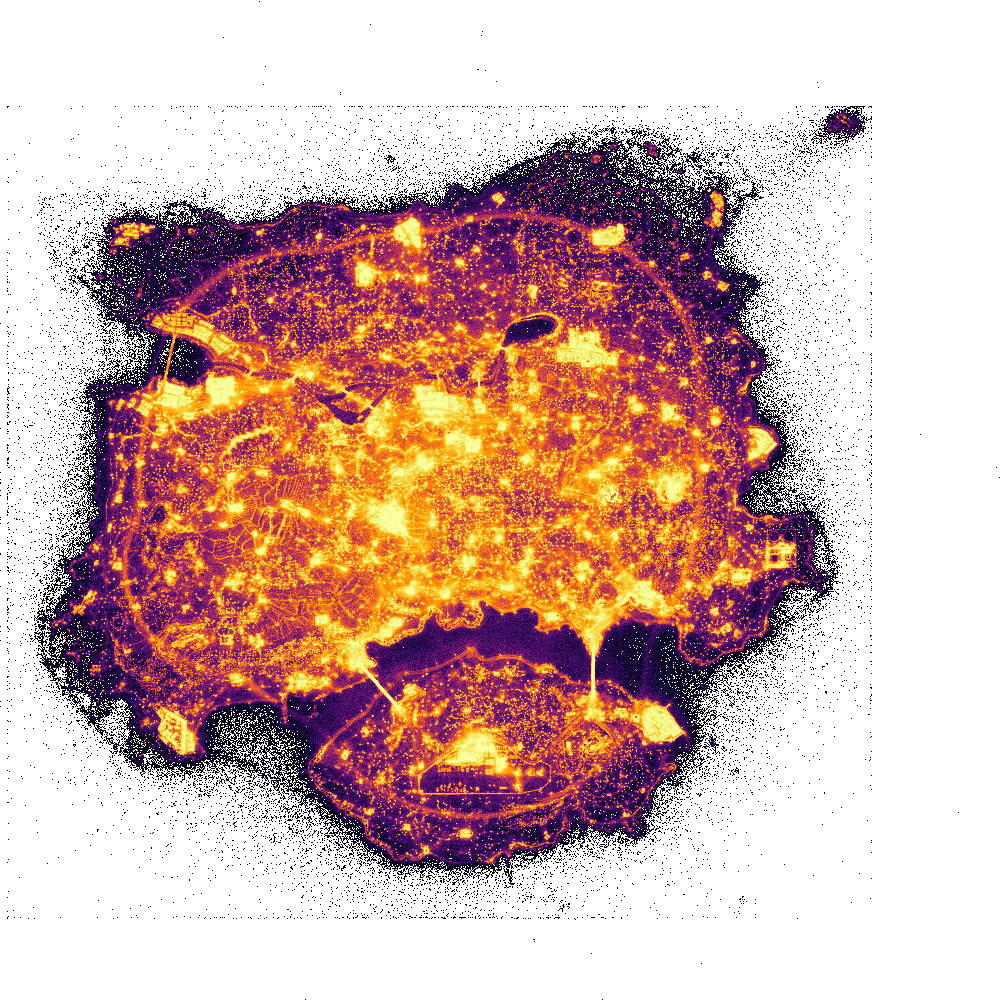

In [12]:
tf.shade(agg, cmap=inferno, how='eq_hist')

# Typical weapon

In [13]:
w_types = {'melee': ['Punch', 'Pan', 'Machete', 'Sickle', 'Crowbar'],
           'bluezone': ['Bluezone'],
           'redzone': ['RedZone', 'death.Buff_FireDOT_C'],
           'nature': ['Drown', 'Falling'],
           'vehicle': ['Hit by Car', 'Motorbike (SideCar)', 'Boat',
                       'Buggy', 'Uaz', 'Dacia', 'Aquarail', 'Motorbike'],
           'pistol': ['R1895', 'P1911', 'P18C', 'P92'],
           'granade': ['death.ProjMolotov_DamageField_C', 'Grenade', 'death.ProjMolotov_C'],
           'sniper': ['VSS', 'Kar98k', 'SKS', 'M24', 'Mini 14', 'Mk14', 'AWM', 'Crossbow'],
           'smg': ['Micro UZI', 'Vector', 'Tommy Gun', 'UMP9'],
           'shotgun': ['S686', 'S1897', 'S12K'],
           'assault': ['M16A4', 'AKM', 'SCAR-L', 'M416', 'AUG', 'Groza', 'DP-28', 'M249'],
           'DaO': ['Down and Out']
}

In [14]:
wt_inverse = {v:k for k, collection in w_types.items() for v in collection}

In [15]:
colors = {'DaO':'grey',
 'assault':'orange',
 'bluezone':'blue',
 'granade':'green',
 'melee':'aqua',
 'mg':'orange',
 'nature':'black',
 'pistol':'yellow',
 'redzone':'red',
 'shotgun':'darkred',
 'smg': 'darkorange',
 'sniper':'magenta',
 'special':'purple',
 'vehicle':'teal'}

In [16]:
erengel['weapon_type'] = erengel['killed_by'].map(wt_inverse).astype('category')

/Users/philippk/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [17]:
agg_cat = cvs.points(erengel, 'victim_position_x', 'victim_position_y', ds.count_cat('weapon_type'))

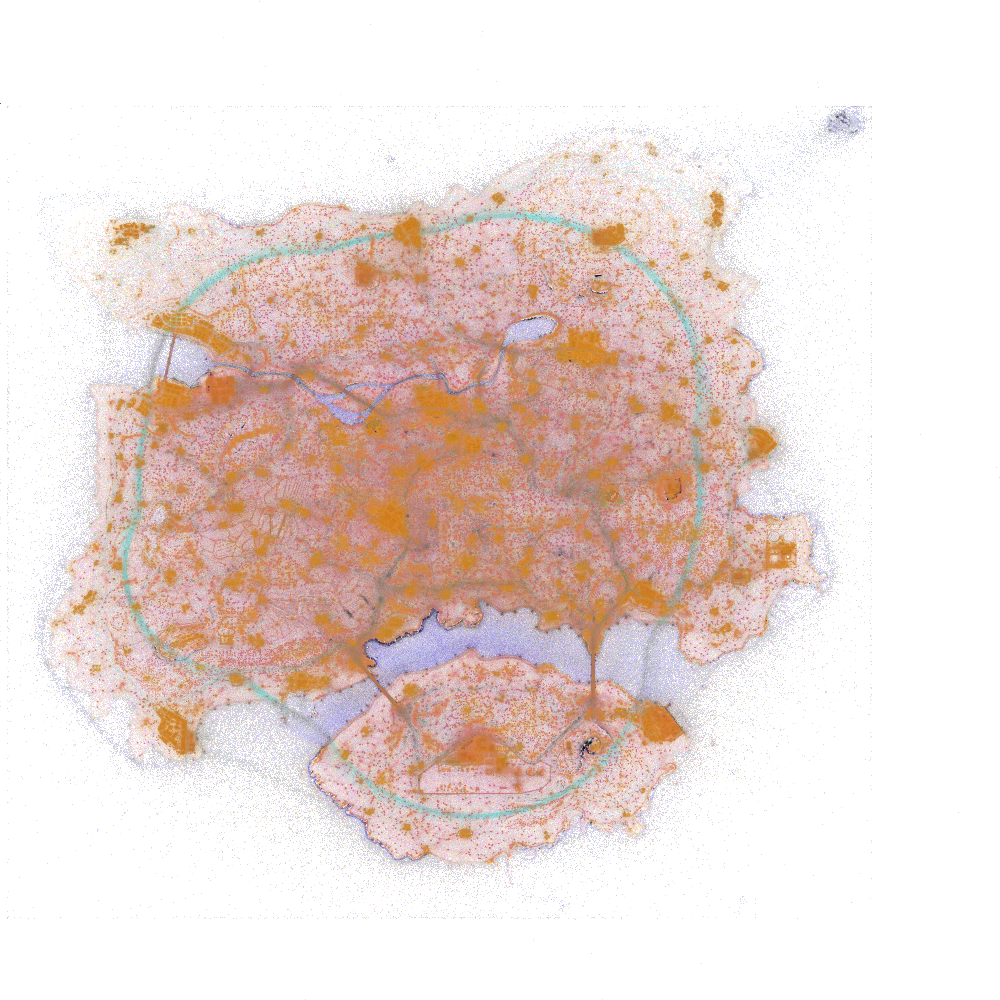

In [18]:
tf.shade(agg_cat, color_key=colors)

# Time of death

In [20]:
agg_time = cvs.points(erengel, 'victim_position_x', 'victim_position_y', ds.mean('time'))

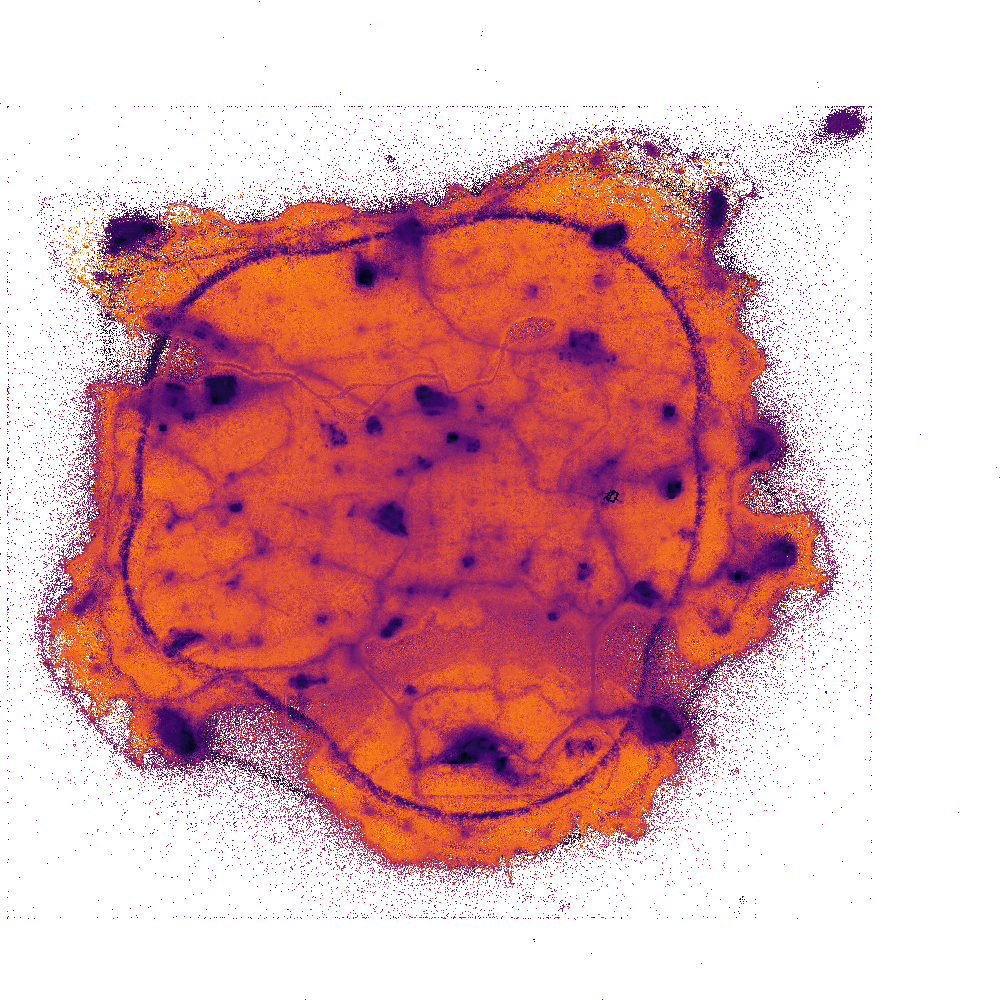

In [22]:
tf.shade(agg_time, cmap=inferno, how='linear')